# 1. Import libraries and data

In [1]:
import pandas as pd
import numpy as np
import warnings
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from scipy.stats import chi2_contingency


pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('creditcardmarketing.csv', header = None)
data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,1,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,2,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39.0,106.0,78.0,366.0
2,3,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
3,4,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
4,5,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,17996,No,Cash Back,Letter,High,1,No,Low,1,1,5,Yes,167.50,136.0,65.0,71.0,398.0
17996,17997,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,940.0,943.0,535.0
17997,17998,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,767.0,1170.0,1494.0
17998,17999,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,983.0,865.0,1615.0


In [3]:
null_data = data[data.isna().any(axis = 1)]
null_data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
323,324,No,Points,Postcard,Medium,1,No,High,1,1,4,No,NaN,NaN,NaN,NaN,NaN
3070,3071,Yes,Air Miles,Postcard,Low,3,No,Medium,2,1,4,Yes,NaN,NaN,NaN,NaN,NaN
3108,3109,No,Air Miles,Letter,Low,1,No,High,3,1,4,Yes,NaN,NaN,NaN,NaN,NaN
3789,3790,No,Air Miles,Letter,Medium,2,No,High,3,1,3,No,NaN,NaN,NaN,NaN,NaN
5083,5084,No,Points,Letter,Medium,1,No,High,1,1,3,Yes,NaN,NaN,NaN,NaN,NaN
5677,5678,No,Air Miles,Postcard,Low,1,No,Low,2,1,4,Yes,NaN,NaN,NaN,NaN,NaN
5689,5690,No,Air Miles,Postcard,Medium,1,No,Medium,3,1,5,No,NaN,NaN,NaN,NaN,NaN
6932,6933,No,Air Miles,Postcard,Medium,1,No,Medium,2,2,4,Yes,NaN,NaN,NaN,NaN,NaN
7787,7788,No,Air Miles,Letter,Low,2,No,Low,1,1,4,Yes,NaN,NaN,NaN,NaN,NaN
7864,7865,No,Cash Back,Postcard,High,2,Yes,Low,2,1,3,No,NaN,NaN,NaN,NaN,NaN


In [4]:
null_data.to_csv('null_data.csv')

In [5]:
# Assign names to the columns since the original csv did not have a header, and set index

data.columns = ["customer_number", "offer_accepted", "reward", "mailer_type", "income_level", 
           "bank_accounts_open", "overdraft_protection", "credit_rating", "credit_cards_held", "homes_owned",
          "household_size", "own_your_home", "average_balance", "balance_q1", "balance_q2", "balance_q3", "balance_q4"]

#data = data.set_index("customer_number")

data.head()

,customer_number,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
0,1,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,2,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39.0,106.0,78.0,366.0
2,3,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
3,4,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
4,5,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0


In [6]:
data = data.drop(['customer_number'], axis = 1)

In [7]:
data

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39.0,106.0,78.0,366.0
2,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
3,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
4,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,No,Cash Back,Letter,High,1,No,Low,1,1,5,Yes,167.50,136.0,65.0,71.0,398.0
17996,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,940.0,943.0,535.0
17997,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,767.0,1170.0,1494.0
17998,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,983.0,865.0,1615.0


# 2. Cleaning/EDA

In [8]:
# Check the column types 

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18000 entries, 0 to 17999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   offer_accepted        18000 non-null  object 
 1   reward                18000 non-null  object 
 2   mailer_type           18000 non-null  object 
 3   income_level          18000 non-null  object 
 4   bank_accounts_open    18000 non-null  int64  
 5   overdraft_protection  18000 non-null  object 
 6   credit_rating         18000 non-null  object 
 7   credit_cards_held     18000 non-null  int64  
 8   homes_owned           18000 non-null  int64  
 9   household_size        18000 non-null  int64  
 10  own_your_home         18000 non-null  object 
 11  average_balance       17976 non-null  float64
 12  balance_q1            17976 non-null  float64
 13  balance_q2            17976 non-null  float64
 14  balance_q3            17976 non-null  float64
 15  balance_q4         

- The column types correspond to what was expected. 
- There are 7 categorical columns and 9 numerical.

In [9]:
# Check NaNs

data.isna().sum()

offer_accepted           0
reward                   0
mailer_type              0
income_level             0
bank_accounts_open       0
overdraft_protection     0
credit_rating            0
credit_cards_held        0
homes_owned              0
household_size           0
own_your_home            0
average_balance         24
balance_q1              24
balance_q2              24
balance_q3              24
balance_q4              24
dtype: int64

In [10]:
data.shape

(18000, 16)

In [11]:
24/18000

0.0013333333333333333

In [12]:
# There are 24 rows with NaNs
# Since they represent only the 0.1% of the dataframe, we drop them

data = data.dropna()
data.shape

(17976, 16)

In [13]:
data.isna().sum()

offer_accepted          0
reward                  0
mailer_type             0
income_level            0
bank_accounts_open      0
overdraft_protection    0
credit_rating           0
credit_cards_held       0
homes_owned             0
household_size          0
own_your_home           0
average_balance         0
balance_q1              0
balance_q2              0
balance_q3              0
balance_q4              0
dtype: int64

In [14]:
# Descriptive statistics of the numerical variables

data.describe()

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
count,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000
mean,1.255730,1.903427,1.203549,3.499110,940.515562,910.450656,999.392190,1042.033600,810.185803
std,0.472405,0.797086,0.427446,1.114476,350.297837,620.077060,457.402268,553.452599,559.001365
min,1.000000,1.000000,1.000000,1.000000,48.250000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,3.000000,787.500000,392.750000,663.000000,633.000000,363.000000
50%,1.000000,2.000000,1.000000,3.000000,1007.000000,772.000000,1032.000000,945.500000,703.000000
75%,1.000000,2.000000,1.000000,4.000000,1153.250000,1521.000000,1342.000000,1463.000000,1212.000000
max,3.000000,4.000000,3.000000,9.000000,3366.250000,3450.000000,3421.000000,3823.000000,4215.000000


Some comments:
- Most customers have 1 account and 2 credit cards.
- The variable homes_owned has a minimum of 1 (what about customers that don't own a house?). Check if this corresponds with the variable "own_your_home".
- The mean houshold has 3.5 members.
- The average balance is higher in Q3.
- Some customers have 0 balance in one or more quarter. Check those customers in case there is an error.

In [15]:
data[data['balance_q1'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
5557,No,Air Miles,Letter,Low,1,No,High,1,1,5,Yes,1086.50,0.0,1621.0,1542.0,1183.0
10829,No,Cash Back,Postcard,High,1,No,Low,1,1,4,Yes,174.25,0.0,465.0,23.0,209.0
11246,No,Points,Postcard,Medium,1,Yes,Medium,3,1,3,Yes,207.25,0.0,425.0,135.0,269.0
14828,No,Points,Postcard,Medium,1,No,Medium,2,1,2,Yes,166.00,0.0,32.0,499.0,133.0
17140,No,Points,Letter,Medium,1,No,Low,2,1,4,Yes,241.50,0.0,182.0,348.0,436.0


In [16]:
data[data['balance_q2'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
11276,No,Points,Postcard,Medium,1,No,High,1,1,5,No,63.5,72.0,0.0,45.0,137.0


In [17]:
data[data['balance_q3'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
11399,No,Cash Back,Postcard,High,3,Yes,Low,2,1,2,Yes,290.5,286.0,457.0,0.0,419.0


In [18]:
data[data['balance_q4'] == 0]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
319,No,Points,Letter,Low,1,No,Medium,2,1,4,Yes,287.25,265.0,409.0,475.0,0.0
3310,No,Points,Letter,High,1,No,Medium,2,1,3,No,124.25,235.0,238.0,24.0,0.0
5421,No,Cash Back,Letter,High,1,No,Medium,2,2,5,Yes,169.50,409.0,223.0,46.0,0.0
9008,No,Cash Back,Letter,Low,1,No,Low,1,1,3,No,996.00,1969.0,1066.0,949.0,0.0
16769,No,Points,Letter,Medium,1,No,High,2,1,5,No,217.00,472.0,260.0,136.0,0.0


These customers had 0 balance in one of the quarters of last year, but this doesn't look as an error.

### Visualizations to check distributions and unique values of each column

In [19]:
# Target

px.histogram(data, x='offer_accepted')

**Here we have imbalanced data in our target and we should deal with that. But it can be seen that the number of 'NO's are much higher than 'Yes'.**

In [20]:
# Independent variables: categorical 

categoricals = data.select_dtypes(object).drop("offer_accepted", axis=1)

for col in categoricals.columns:
    fig = px.histogram(data, x=col)
    fig.show()

**Based on the barplots for categorical columns, it can be seen that none of the categories have too many values. So, they can be used for encoding. Also, most of them are either boolean (Yes/No) or ordinal. We will only have to use one hot encoding in reward and in mailer_type**

In [21]:
# Independent variables: numerical discrete 

discrete = data.select_dtypes(int)

for col in discrete.columns:
    fig = px.histogram(data, x=col)
    fig.update_layout(bargap=0.2) # add space between bars
    fig.show()

In [22]:
# Independent variables: numerical continuous 

continuous = data.select_dtypes(float)

for col in continuous.columns:
    fig = px.histogram(data, x=col)
    fig.show()

Comments:
- offer_accepted: the target is very imbalanced.
- reward, mailer_type: uniform distribution.
- income_level: medium is the most common category, as would be expected. 
- bank_accounts_open: most customers have only one.
- overdraft_protection: vast majority of no's.
- credit_rating: uniform distribution.
- own_your_home: majority of yes but there are more than 6000 customers that don't own their home. This does't correspond with "homes_owned".
- bank_accounts_open: majority of 1.
- credit_cards_held: majority of 2 but also 1 is quite common. There are no customers that don't own a credit card.
- homes_owned: majority of 1. 14,500 customers answered they own a home vs 11,600 that answered "yes" when asked if they owned their home. Consider what to do with these two columns.
- household_size: bell shaped distribution, with the most common being 3 and 4.
- The continuous variables are not normally distributed, however, logistic regression does not assume a normal distribution of the error terms (residuals), so this is not a problem. Nevertheless, we should try to apply transformations and see how it affects the model.

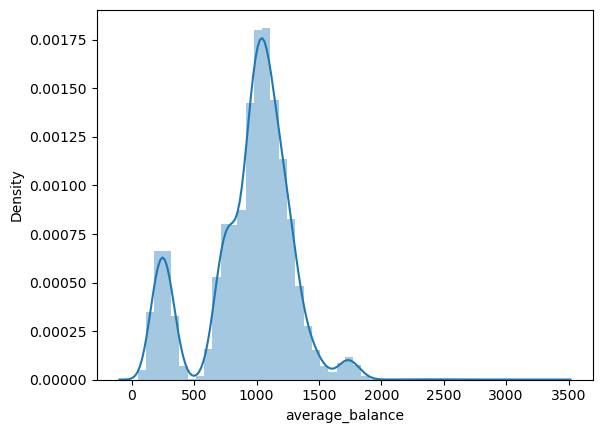

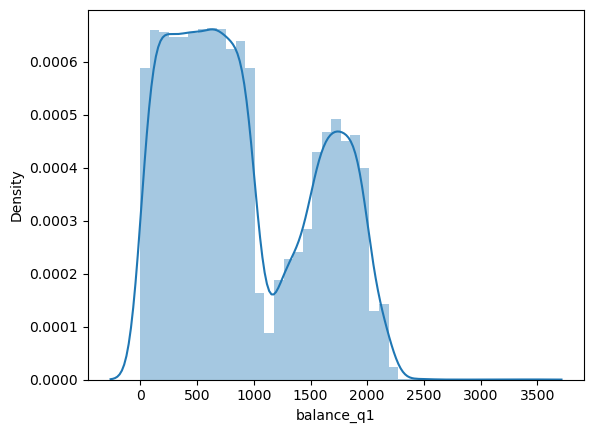

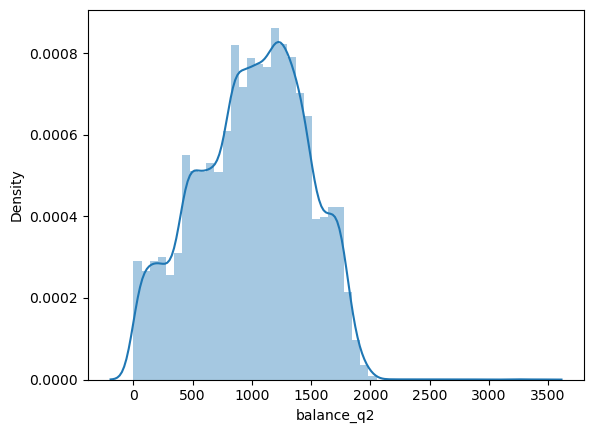

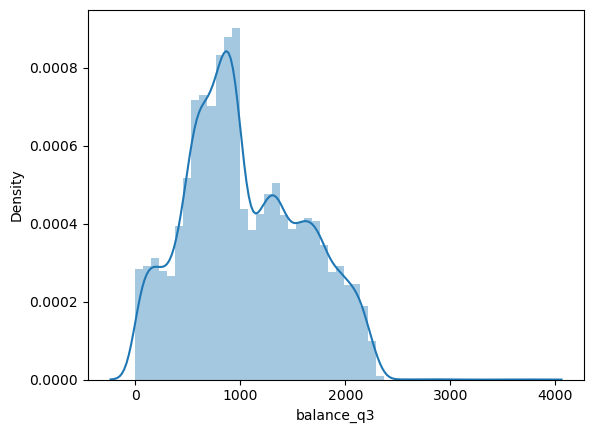

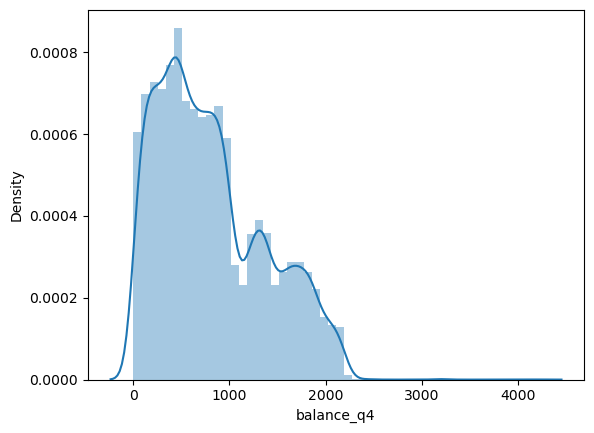

In [23]:
for i in continuous.columns:
    sns.distplot(continuous[i])
    plt.show()

**It can be seen from the distributions that the continous numerical columns don't have a normal distribution. However, it looks like balance q2&3&4 have a closer distribution to normal.**

**It can be seen that the average_balance is correlated with balance_q1, balance_q2, balance_q3, balance_q4**

### Outliers in numerical continuous

In [24]:
# Using box plot to show the outliers:

for col in continuous.columns:
    fig = px.box(data, x=col)
    fig.show()

Average balance has a considerable number of outliers, while the quarters balances have much less (looks like less than 10), and they are all above the upper fence. Let's have a look at those.

In [25]:
# Checking the outliers for balance_q1,q2,q3,q4 by filtering the ones higher than upper fence

quarter_outliers = data.index[data['balance_q1'] >2509].tolist()

for customer in data.index[data['balance_q2'] >2351].tolist():
    quarter_outliers.append(customer)

for customer in data.index[data['balance_q3'] >2576].tolist():
    quarter_outliers.append(customer)
    
for customer in data.index[data['balance_q4'] >2475].tolist():
    quarter_outliers.append(customer)
    
quarter_outliers = list(dict.fromkeys(quarter_outliers)) # removes duplicates because dictionaries can't have duplicate keys
quarter_outliers

[12635, 2296, 8887, 10576, 15259, 14003, 15608, 2655, 8777, 12633]

In [26]:
len(quarter_outliers)

10

In [27]:
data[data.index.isin(quarter_outliers)] # Showing the outliers in a dataframe

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
2296,No,Air Miles,Letter,High,1,No,Medium,2,2,2,No,3366.25,2509.0,2918.0,3823.0,4215.0
2655,No,Points,Letter,Medium,1,Yes,Low,2,1,5,No,2336.75,1638.0,2351.0,2180.0,3178.0
8777,No,Cash Back,Postcard,Medium,1,No,High,1,1,2,No,2073.25,1490.0,1704.0,1898.0,3201.0
8887,No,Cash Back,Letter,Medium,1,No,Medium,2,1,2,Yes,2738.50,2453.0,3240.0,3016.0,2245.0
10576,No,Points,Letter,Medium,3,No,High,1,1,2,Yes,2609.50,2310.0,3421.0,2802.0,1905.0
12633,No,Cash Back,Letter,Medium,1,No,Medium,3,1,3,Yes,1182.00,179.0,217.0,1114.0,3218.0
12635,No,Air Miles,Letter,High,1,No,High,3,2,4,No,2948.50,3450.0,3214.0,2750.0,2380.0
14003,No,Cash Back,Letter,Medium,1,No,Medium,1,1,1,Yes,2437.50,2250.0,2134.0,2945.0,2421.0
15259,No,Air Miles,Letter,Medium,1,No,High,2,1,3,No,2320.50,2502.0,2445.0,2012.0,2323.0
15608,No,Points,Postcard,High,1,No,Low,1,1,4,Yes,2271.50,1666.0,1468.0,2761.0,3191.0


We have 10 customers that are outliers in one or more of the quarters balances columns. Now let's check if these customers are also outliers in the average_balance column:

In [28]:
# Checking the outliers in average_balance

average_outliers_upper = data.index[data['average_balance'] >1700.75].tolist()
len(average_outliers_upper)

278

In [29]:
quarter_outliers_df = data[data.index.isin(quarter_outliers)]
quarter_outliers_df["average_outlier"] = quarter_outliers_df.index.isin(average_outliers_upper)

quarter_outliers_df

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4,average_outlier
2296,No,Air Miles,Letter,High,1,No,Medium,2,2,2,No,3366.25,2509.0,2918.0,3823.0,4215.0,True
2655,No,Points,Letter,Medium,1,Yes,Low,2,1,5,No,2336.75,1638.0,2351.0,2180.0,3178.0,True
8777,No,Cash Back,Postcard,Medium,1,No,High,1,1,2,No,2073.25,1490.0,1704.0,1898.0,3201.0,True
8887,No,Cash Back,Letter,Medium,1,No,Medium,2,1,2,Yes,2738.50,2453.0,3240.0,3016.0,2245.0,True
10576,No,Points,Letter,Medium,3,No,High,1,1,2,Yes,2609.50,2310.0,3421.0,2802.0,1905.0,True
12633,No,Cash Back,Letter,Medium,1,No,Medium,3,1,3,Yes,1182.00,179.0,217.0,1114.0,3218.0,False
12635,No,Air Miles,Letter,High,1,No,High,3,2,4,No,2948.50,3450.0,3214.0,2750.0,2380.0,True
14003,No,Cash Back,Letter,Medium,1,No,Medium,1,1,1,Yes,2437.50,2250.0,2134.0,2945.0,2421.0,True
15259,No,Air Miles,Letter,Medium,1,No,High,2,1,3,No,2320.50,2502.0,2445.0,2012.0,2323.0,True
15608,No,Points,Postcard,High,1,No,Low,1,1,4,Yes,2271.50,1666.0,1468.0,2761.0,3191.0,True


All are also outliers in the average_balance column with the exception of one:

In [30]:
quarter_outliers_df[quarter_outliers_df['average_outlier']== False]

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4,average_outlier
12633,No,Cash Back,Letter,Medium,1,No,Medium,3,1,3,Yes,1182.0,179.0,217.0,1114.0,3218.0,False


These 10 columns could be dropped, but for the average_balance we have to consider to drop or not the outliers. How many rows are outliers in this column?

In [31]:
average_outliers_lower = data.index[data['average_balance'] < 239].tolist()
len(average_outliers_lower)

1163

In [32]:
len(average_outliers_upper) + len(average_outliers_lower)

1441

In [33]:
data.shape

(17976, 16)

In [34]:
1441/17976*100 # percentage of the dataframe that are outliers 

8.016243880729862

**The number of deleted rows would be 1441 which is 8% of the whole data. Therefore, it can be deleted and can be checked later with higher threshold to see if the performance of the model would be affected.**

In [35]:
data = data[(data['average_balance']>=239) & (data['average_balance']<=1700.75)] #removing outliers from the data
data.shape

(16535, 16)

In [36]:
data

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
2,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
3,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
4,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0
5,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,1365.0,750.0,497.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17994,No,Air Miles,Postcard,Medium,1,No,Low,2,1,2,Yes,985.25,295.0,917.0,1608.0,1121.0
17996,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,940.0,943.0,535.0
17997,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,767.0,1170.0,1494.0
17998,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,983.0,865.0,1615.0


In [37]:
data = data.reset_index()

In [38]:
data

,index,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
0,0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,2,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
2,3,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
3,4,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0
4,5,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,1365.0,750.0,497.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16530,17994,No,Air Miles,Postcard,Medium,1,No,Low,2,1,2,Yes,985.25,295.0,917.0,1608.0,1121.0
16531,17996,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,940.0,943.0,535.0
16532,17997,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,767.0,1170.0,1494.0
16533,17998,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,983.0,865.0,1615.0


In [39]:
data = data.drop(['index'], axis = 1)

In [40]:
data

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q2,balance_q3,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,877.0,1095.0,1002.0
1,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,352.0,145.0,242.0
2,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,1760.0,1119.0,419.0
3,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,1357.0,982.0,365.0
4,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,1365.0,750.0,497.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16530,No,Air Miles,Postcard,Medium,1,No,Low,2,1,2,Yes,985.25,295.0,917.0,1608.0,1121.0
16531,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,940.0,943.0,535.0
16532,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,767.0,1170.0,1494.0
16533,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,983.0,865.0,1615.0


### Relationships between variables

In [41]:
numericals = data.select_dtypes(np.number)
categoricals = data.select_dtypes(np.object)

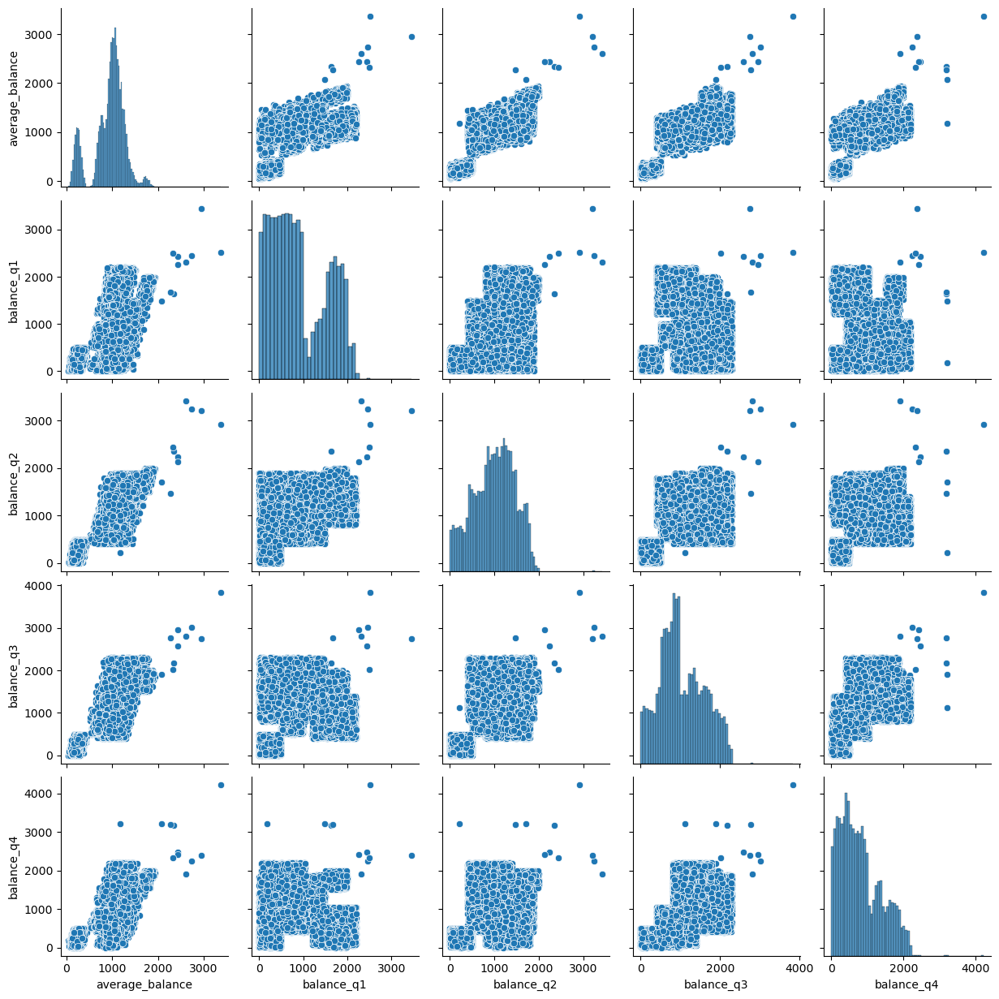

In [42]:
# Checking the relationships between continous columns and see if they are correlated

sns.pairplot(continuous)

Looks like there is some correlation between average_balance and the Q1, Q2, Q3 and Q4 balances, which has sense since average_balance is the average of the other 4 columns.

**Using plots to check relationships within the categorical variables**

In [43]:
for col in categoricals.columns:
    fig = px.histogram(data, x=col, color="offer_accepted", barmode="group")
    fig.show()

This kind of plot is interesting, however it would be better to be able to see the relative frecuency.

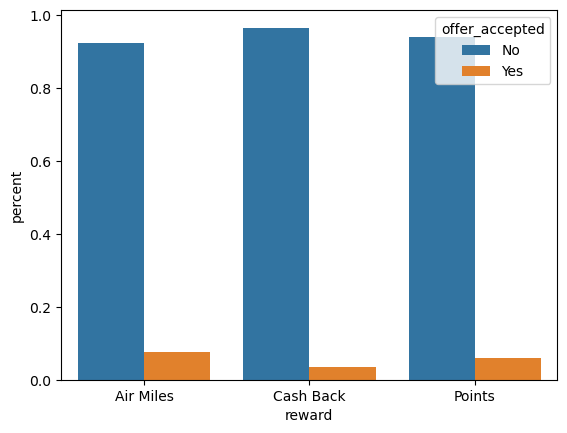

In [44]:
pct = (categoricals.groupby(["reward", "offer_accepted"]).size() / categoricals.groupby(["reward"]).size()).reset_index().rename({0:'percent'}, axis=1)
sns.barplot(x="reward", hue="offer_accepted", y="percent", data=pct)
plt.show()

In [45]:
categoricals

,offer_accepted,reward,mailer_type,income_level,overdraft_protection,credit_rating,own_your_home
0,No,Air Miles,Letter,High,No,High,No
1,No,Air Miles,Postcard,High,No,Medium,Yes
2,No,Air Miles,Letter,Medium,No,High,No
3,No,Air Miles,Letter,Medium,No,Medium,Yes
4,No,Air Miles,Letter,Medium,No,High,No
...,...,...,...,...,...,...,...
16530,No,Air Miles,Postcard,Medium,No,Low,Yes
16531,No,Cash Back,Letter,High,No,Low,Yes
16532,No,Cash Back,Letter,High,No,Low,No
16533,No,Cash Back,Letter,Medium,No,Medium,Yes


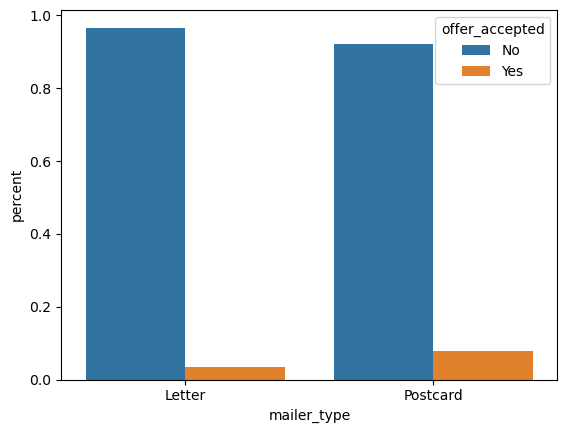

In [46]:
pct = (categoricals.groupby(["mailer_type", "offer_accepted"]).size() / categoricals.groupby(["mailer_type"]).size()).reset_index().rename({0:'percent'}, axis=1)
sns.barplot(x="mailer_type", hue="offer_accepted", y="percent", data=pct)
plt.show()

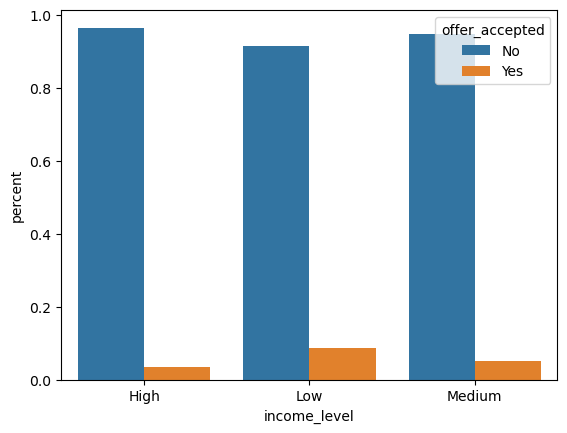

In [47]:
pct = (categoricals.groupby(["income_level", "offer_accepted"]).size() / categoricals.groupby(["income_level"]).size()).reset_index().rename({0:'percent'}, axis=1)
sns.barplot(x="income_level", hue="offer_accepted", y="percent", data=pct)
plt.show()

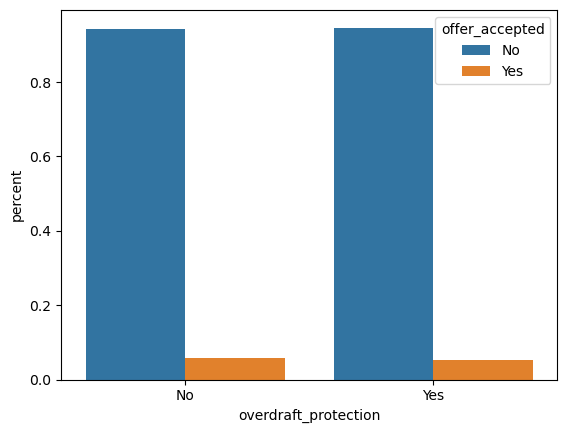

In [48]:
pct = (categoricals.groupby(["overdraft_protection", "offer_accepted"]).size() / categoricals.groupby(["overdraft_protection"]).size()).reset_index().rename({0:'percent'}, axis=1)
sns.barplot(x="overdraft_protection", hue="offer_accepted", y="percent", data=pct)
plt.show()

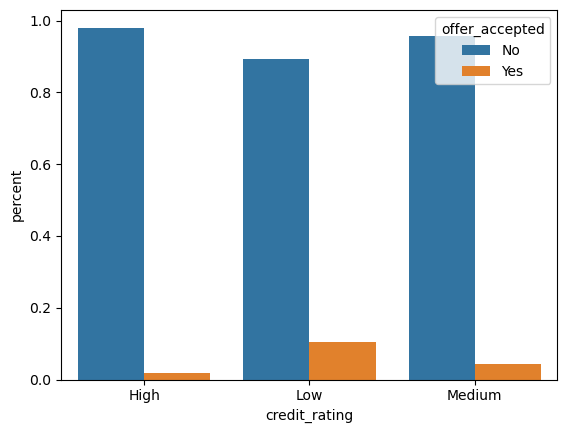

In [49]:
pct = (categoricals.groupby(["credit_rating", "offer_accepted"]).size() / categoricals.groupby(["credit_rating"]).size()).reset_index().rename({0:'percent'}, axis=1)
sns.barplot(x="credit_rating", hue="offer_accepted", y="percent", data=pct)
plt.show()

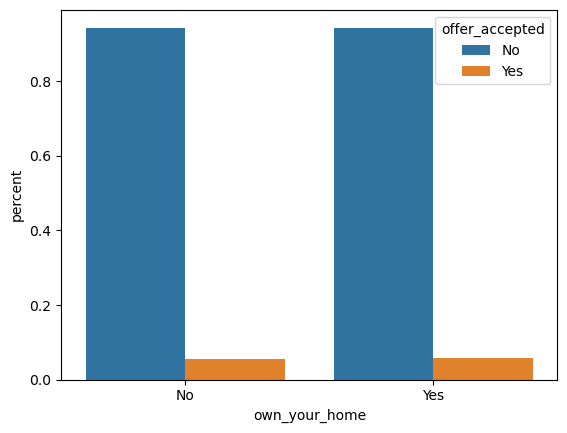

In [50]:
pct = (categoricals.groupby(["own_your_home", "offer_accepted"]).size() / categoricals.groupby(["own_your_home"]).size()).reset_index().rename({0:'percent'}, axis=1)
sns.barplot(x="own_your_home", hue="offer_accepted", y="percent", data=pct)
plt.show()

Comments:
- Looks like there was a higher proportion of accepted offers when the reward were air miles, followed by points. The lower proportion of accepted offers was with cash back.
- Higher proportion of Yes when the mailer type was a postcard.
- Higher proportion of Yes when the customer had a low income level.
- No apparent variation with the variable overdraft_protection.
- Higher proportion of Yes when the customer had a low credit rating.
- No apparent variation with the variable own_your_home.

However, we cannot take this apparent relationships as truths, in order to do that we should perform statistic calculations.

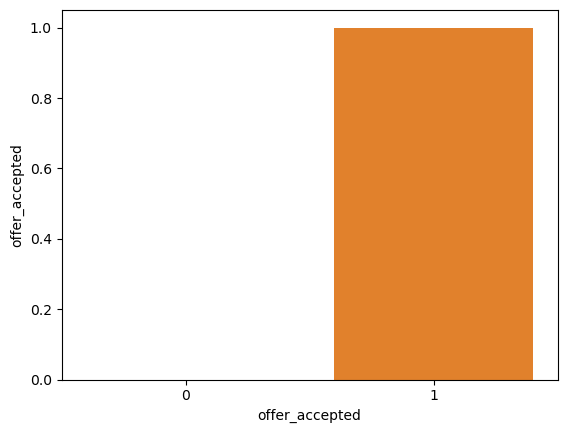

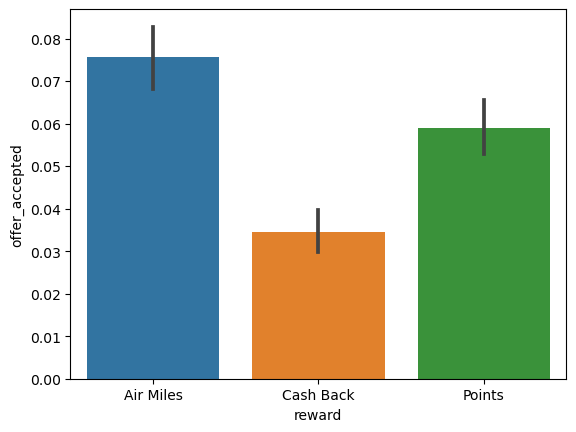

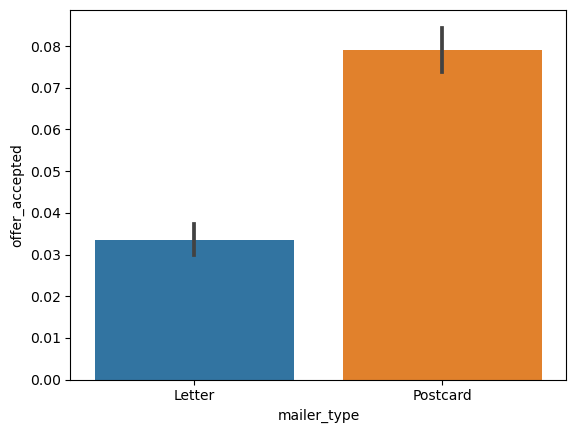

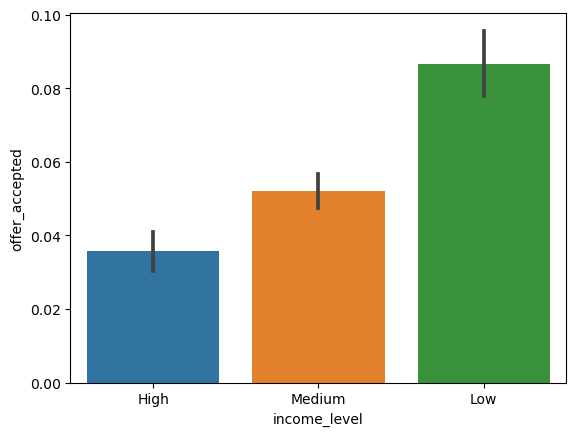

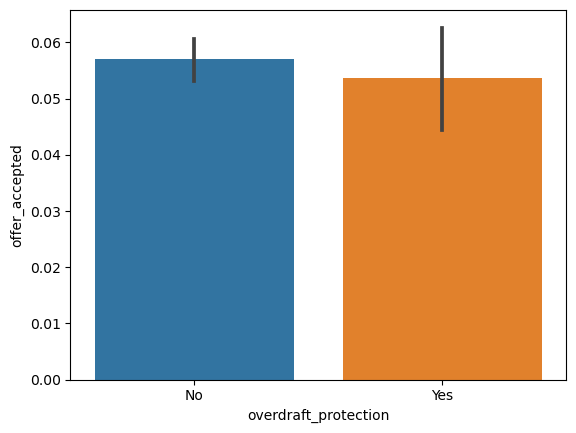

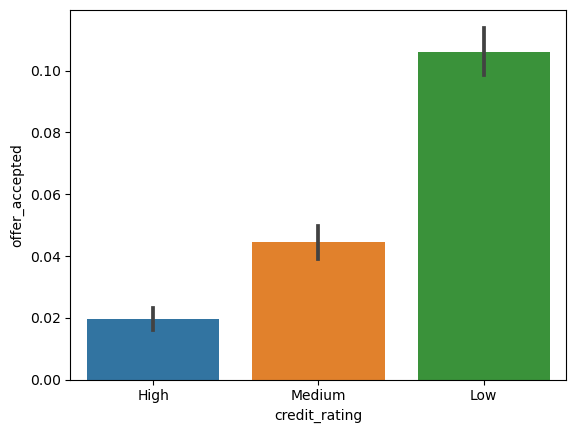

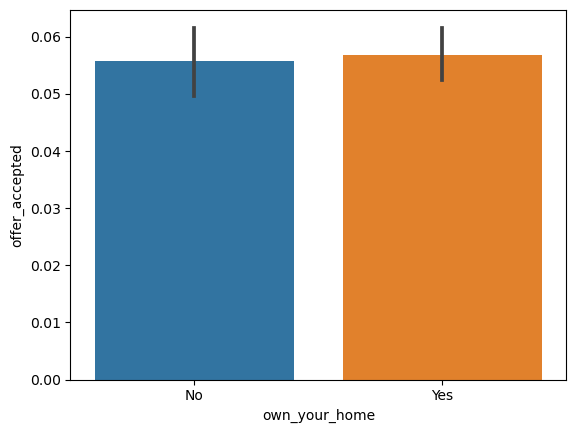

In [51]:
# Another way to look at the relative frecuencies of the accepted offer 

plotting_categoricals = categoricals.copy()
plotting_categoricals["offer_accepted"] = plotting_categoricals["offer_accepted"].apply(lambda x: 1 if x == "Yes" else 0)

for col in categoricals.columns:
    sns.barplot(data=plotting_categoricals, x=col, y="offer_accepted")
    plt.show()

**Using plots to check the correlations between the numerical independent variables and the target**

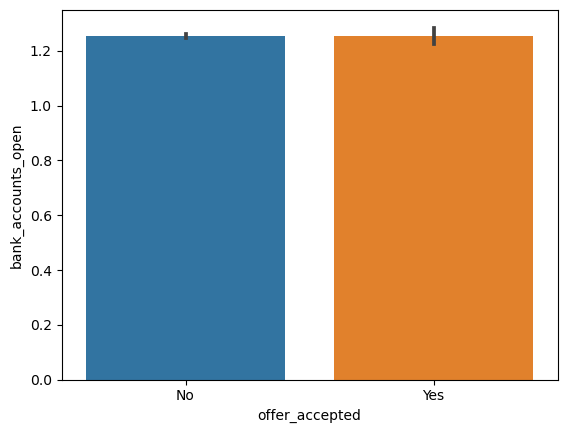

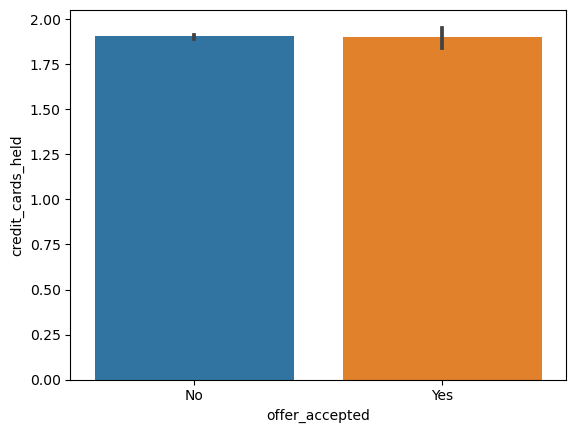

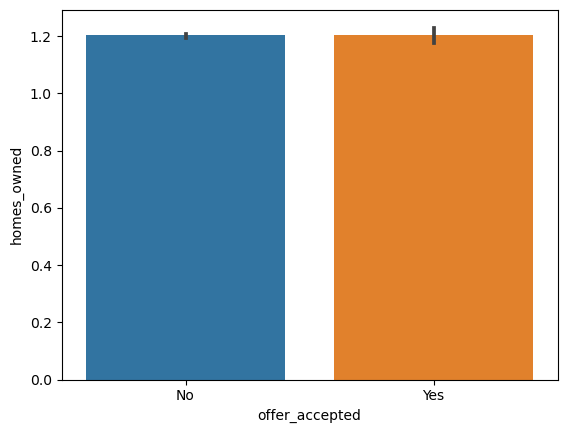

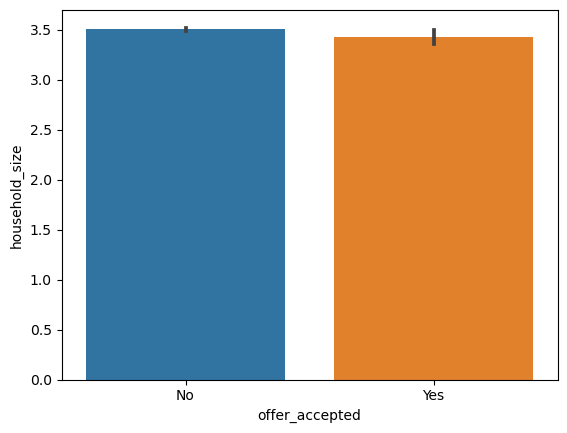

In [52]:
for col in discrete.columns:
    sns.barplot(data=data, x="offer_accepted", y=col)
    plt.show()

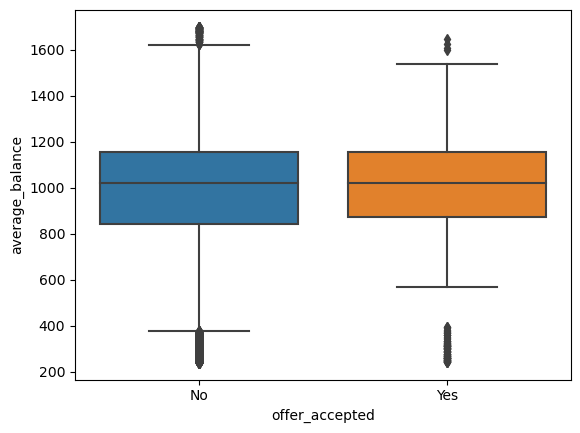

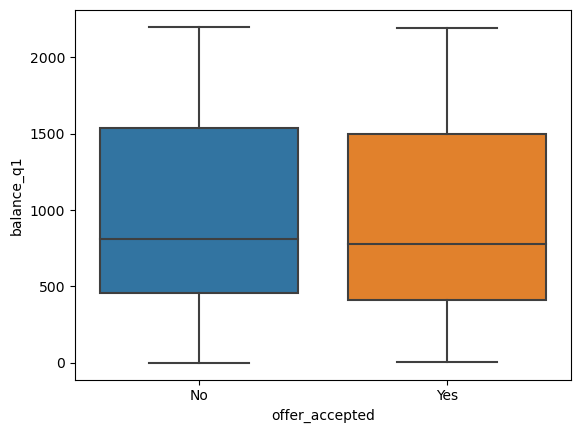

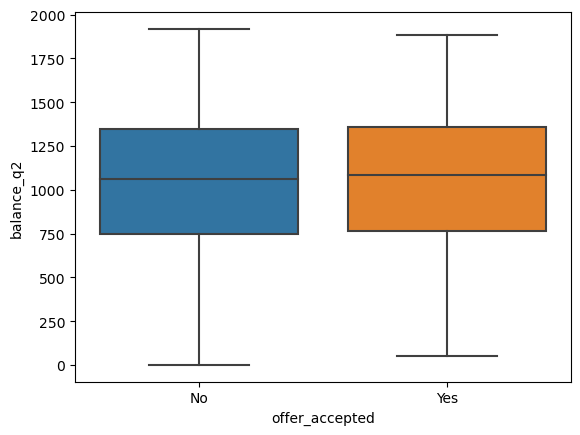

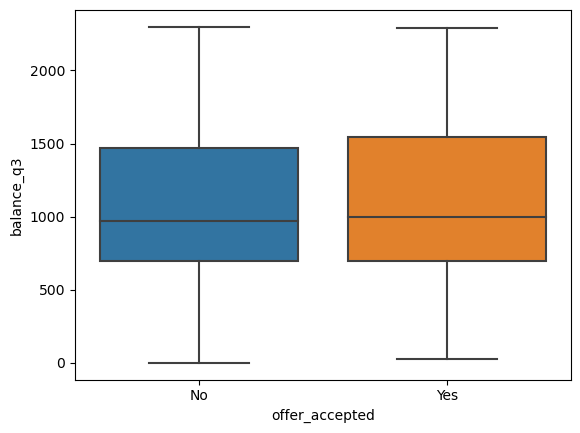

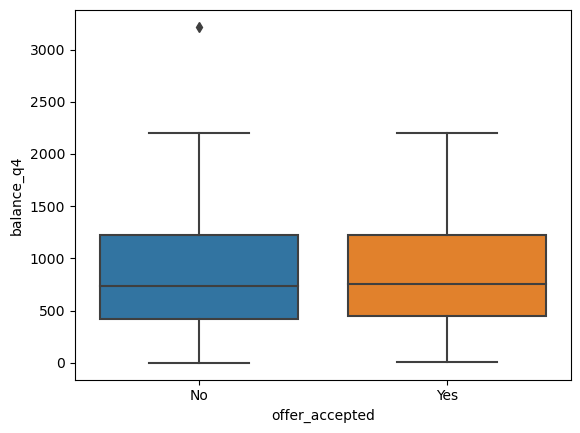

In [53]:
for col in continuous.columns:
    sns.boxplot(data=data, x="offer_accepted", y=col)
    plt.show()

The plots do not show correlations between the numerical variables and the target.

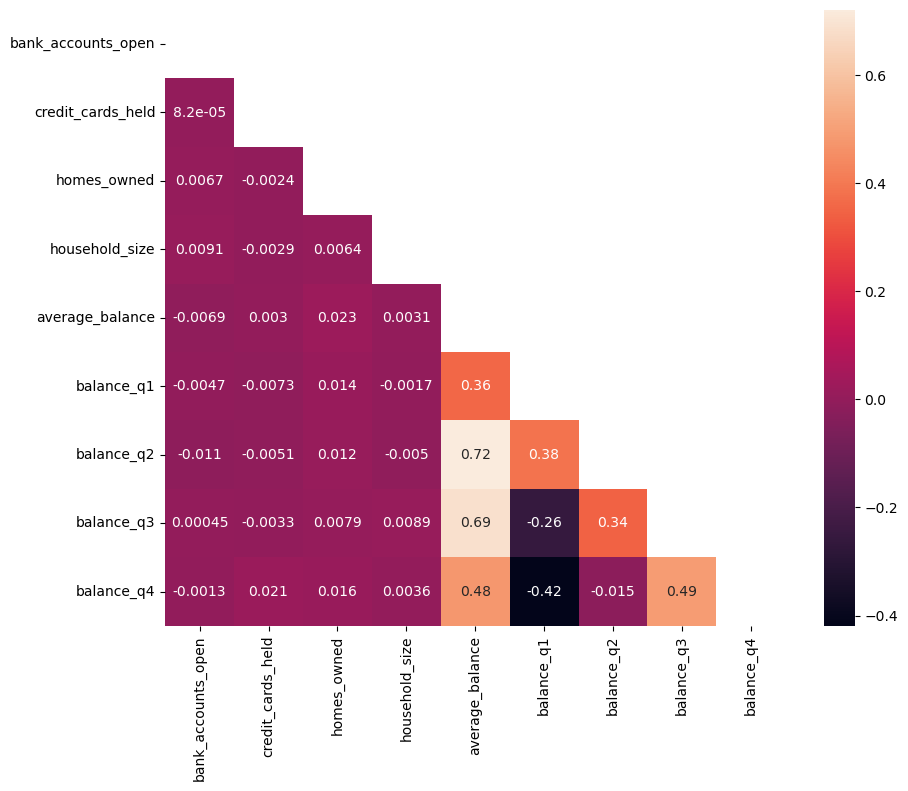

In [54]:
# HEATMAP for numerical columns to check their correlations

mask = np.zeros_like(numericals.corr())
mask[np.triu_indices_from(mask)] = True 
fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(numericals.corr(), mask=mask, annot=True)
plt.show()

**'average_balance' has a high correlation with balance_q2 and balance_q3. Therefore, these 2 columns can be dropped. Another approach can be dropping only average_balance as it has a high number of outliers too and also is correlated with balance q2 and q3. We can try this method and see if this will change the model.**

In [55]:
data1 = data.drop(['balance_q3', 'balance_q2', ], axis = 1)
data1

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,1002.0
1,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,242.0
2,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,419.0
3,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,365.0
4,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,497.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16530,No,Air Miles,Postcard,Medium,1,No,Low,2,1,2,Yes,985.25,295.0,1121.0
16531,No,Cash Back,Letter,High,1,No,Low,3,1,3,Yes,850.50,984.0,535.0
16532,No,Cash Back,Letter,High,1,No,Low,2,1,4,No,1087.25,918.0,1494.0
16533,No,Cash Back,Letter,Medium,1,No,Medium,4,2,2,Yes,1022.25,626.0,1615.0


**Correlations between the categorical variables using the chi-square method**

In [56]:
# offer_accepted (target) and reward

data_crosstab1 = pd.crosstab(data1['offer_accepted'], data1['reward'], margins = False)
data_crosstab1

reward,Air Miles,Cash Back,Points
offer_accepted,,,
No,5136,5329,5136
Yes,421,191,322


In [57]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab1, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab1.columns, index=data_crosstab1.index)

The Chi2 value is:  88.99
The p-value is:  4.7544602687954876e-20
The number of degrees of freedom is:  2
The expected frequencies are: 


reward,Air Miles,Cash Back,Points
offer_accepted,,,
No,5243.105957,5208.195948,5149.698095
Yes,313.894043,311.804052,308.301905


**With the p=0.05 and df = 2, the critical chi-square is 5.991. Therefore 96.57>5.991. Therefore, we reject the null hypothesis which means that the 2 columns are related. Considering this, we keep the 'reward' column as it's important to keep the columns related to the target.**

In [58]:
# own_your_home and credit_rating

data_crosstab2 = pd.crosstab(data1['own_your_home'], data1['credit_rating'], margins = False)
data_crosstab2

credit_rating,High,Low,Medium
own_your_home,,,
No,1957,1949,1905
Yes,3607,3546,3571


In [59]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab2, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab2.columns, index=data_crosstab2.index)

The Chi2 value is:  0.56
The p-value is:  0.7557018048441387
The number of degrees of freedom is:  2
The expected frequencies are: 


credit_rating,High,Low,Medium
own_your_home,,,
No,1955.391836,1931.142728,1924.465437
Yes,3608.608164,3563.857272,3551.534563


**As it could be possible that the credit_rating and owning a house are related to each other, these 2 were chosen to check the correlations. However, 0.56 < 5.991 and the 2 columns are independent.**

In [60]:
# income_level and credit_rating

data_crosstab3 = pd.crosstab(data1['income_level'], data1['credit_rating'], margins = False)
data_crosstab3

credit_rating,High,Low,Medium
income_level,,,
High,1394,1405,1377
Low,1408,1346,1355
Medium,2762,2744,2744


In [61]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab3, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab3.columns, index=data_crosstab3.index)

The Chi2 value is:  1.22
The p-value is:  0.8745601917623385
The number of degrees of freedom is:  4
The expected frequencies are: 


credit_rating,High,Low,Medium
income_level,,,
High,1405.217055,1387.790747,1382.992198
Low,1382.671666,1365.524947,1360.803387
Medium,2776.111279,2741.684306,2732.204415


**1.22<9.488. Therefore, the 2 columns are independent**

In [62]:
# income_level and own_your_home

data_crosstab4 = pd.crosstab(data1['income_level'], data1['own_your_home'], margins = False)
data_crosstab4

own_your_home,No,Yes
income_level,,
High,1503,2673
Low,1428,2681
Medium,2880,5370


In [63]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab4, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab4.columns, index=data_crosstab4.index)

The Chi2 value is:  1.79
The p-value is:  0.4084142586727586
The number of degrees of freedom is:  2
The expected frequencies are: 


own_your_home,No,Yes
income_level,,
High,1467.598186,2708.401814
Low,1444.051950,2664.948050
Medium,2899.349864,5350.650136


**1.79 < 5.991. Therefore, the 2 columns are independent.**

In [64]:
# overdraft_protection and credit_rating

data_crosstab5 = pd.crosstab(data1['overdraft_protection'], data1['credit_rating'], margins = False)
data_crosstab5

credit_rating,High,Low,Medium
overdraft_protection,,,
No,4762,4680,4635
Yes,802,815,841


In [65]:
chi2, p_value, dof, expected_freq = chi2_contingency(data_crosstab5, correction=False)

print("The Chi2 value is: ",round(chi2,2))
print("The p-value is: ",p_value)
print("The number of degrees of freedom is: ",dof)
print("The expected frequencies are: ")
pd.DataFrame(expected_freq, columns=data_crosstab5.columns, index=data_crosstab5.index)

The Chi2 value is:  1.95
The p-value is:  0.3771835930816963
The number of degrees of freedom is:  2
The expected frequencies are: 


credit_rating,High,Low,Medium
overdraft_protection,,,
No,4736.887088,4678.144239,4661.968673
Yes,827.112912,816.855761,814.031327


**1.95<5.991 so the 2 columns are independent.**

# Encode the categoricals that are ordinal or boolean to check the correlation with numericals

In [66]:
numerical = data1.select_dtypes(np.number)
categorical = data1.select_dtypes(np.object)

In [67]:
encoding_categoricals = categorical.copy()

encoding_categoricals.head()

,offer_accepted,reward,mailer_type,income_level,overdraft_protection,credit_rating,own_your_home
0,No,Air Miles,Letter,High,No,High,No
1,No,Air Miles,Postcard,High,No,Medium,Yes
2,No,Air Miles,Letter,Medium,No,High,No
3,No,Air Miles,Letter,Medium,No,Medium,Yes
4,No,Air Miles,Letter,Medium,No,High,No


In [68]:
encoding_categoricals.shape

(16535, 7)

In [69]:
encoding_categoricals =  encoding_categoricals.drop(['offer_accepted'], axis = 1)

In [70]:
encoding_categoricals

,reward,mailer_type,income_level,overdraft_protection,credit_rating,own_your_home
0,Air Miles,Letter,High,No,High,No
1,Air Miles,Postcard,High,No,Medium,Yes
2,Air Miles,Letter,Medium,No,High,No
3,Air Miles,Letter,Medium,No,Medium,Yes
4,Air Miles,Letter,Medium,No,High,No
...,...,...,...,...,...,...
16530,Air Miles,Postcard,Medium,No,Low,Yes
16531,Cash Back,Letter,High,No,Low,Yes
16532,Cash Back,Letter,High,No,Low,No
16533,Cash Back,Letter,Medium,No,Medium,Yes


In [71]:
# offer_accepted, overdraft_protection and own_your_home are boolean

#encoding_categoricals["offer_accepted"] = categoricals["offer_accepted"].apply(lambda x: 1 if x == "Yes" else 0)
encoding_categoricals["overdraft_protection"] = categoricals["overdraft_protection"].apply(lambda x: 1 if x == "Yes" else 0)
encoding_categoricals["own_your_home"] = categoricals["own_your_home"].apply(lambda x: 1 if x == "Yes" else 0)

# income_level and credit_rating are ordinal

encoding_categoricals["income_level"] = categoricals["income_level"].map({"Low" : 0, "Medium" : 1, "High" : 2})
encoding_categoricals["credit_rating"] = categoricals["credit_rating"].map({"Low" : 0, "Medium" : 1, "High" : 2})

In [72]:
#Using get_dummies to encode the 'mailer_type' and 'reward' columns
encoding_categoricals = pd.get_dummies(encoding_categoricals, columns=['mailer_type', 'reward'])
encoding_categoricals

,income_level,overdraft_protection,credit_rating,own_your_home,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,2,0,2,0,1,0,1,0,0
1,2,0,1,1,0,1,1,0,0
2,1,0,2,0,1,0,1,0,0
3,1,0,1,1,1,0,1,0,0
4,1,0,2,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...
16530,1,0,0,1,0,1,1,0,0
16531,2,0,0,1,1,0,0,1,0
16532,2,0,0,0,1,0,0,1,0
16533,1,0,1,1,1,0,0,1,0


In [73]:
for column in encoding_categoricals.columns:
    print(column)
    print(encoding_categoricals[column].value_counts())
    print("")

income_level
1    8250
2    4176
0    4109
Name: income_level, dtype: int64

overdraft_protection
0    14077
1     2458
Name: overdraft_protection, dtype: int64

credit_rating
2    5564
0    5495
1    5476
Name: credit_rating, dtype: int64

own_your_home
1    10724
0     5811
Name: own_your_home, dtype: int64

mailer_type_Letter
0    8385
1    8150
Name: mailer_type_Letter, dtype: int64

mailer_type_Postcard
1    8385
0    8150
Name: mailer_type_Postcard, dtype: int64

reward_Air Miles
0    10978
1     5557
Name: reward_Air Miles, dtype: int64

reward_Cash Back
0    11015
1     5520
Name: reward_Cash Back, dtype: int64

reward_Points
0    11077
1     5458
Name: reward_Points, dtype: int64



In [74]:
new_numericals = encoding_categoricals.select_dtypes(np.number)
new_numericals = pd.concat([numericals, new_numericals], axis=1)
new_numericals.head()

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q2,balance_q3,balance_q4,income_level,overdraft_protection,credit_rating,own_your_home,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,1,2,1,4,1160.75,1669.0,877.0,1095.0,1002.0,2,0,2,0,1,0,1,0,0
1,2,2,1,2,276.50,367.0,352.0,145.0,242.0,2,0,1,1,0,1,1,0,0
2,2,1,1,4,1219.00,1578.0,1760.0,1119.0,419.0,1,0,2,0,1,0,1,0,0
3,1,2,1,6,1211.00,2140.0,1357.0,982.0,365.0,1,0,1,1,1,0,1,0,0
4,1,3,1,4,1114.75,1847.0,1365.0,750.0,497.0,1,0,2,0,1,0,1,0,0


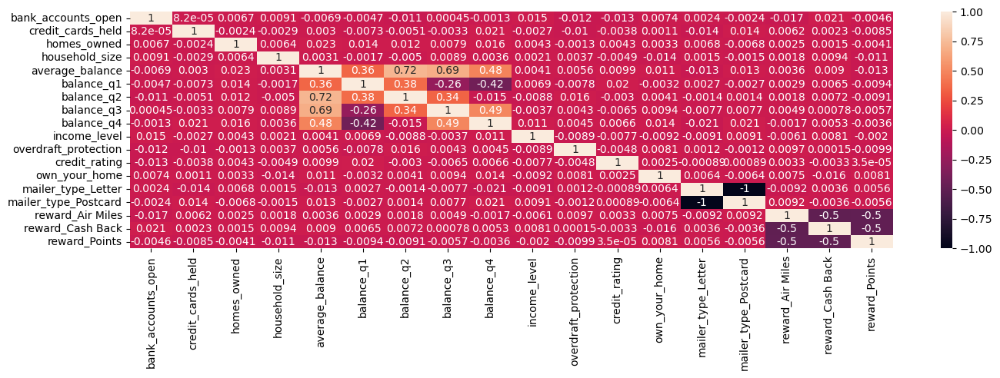

In [75]:
mask = np.zeros_like(new_numericals.corr())
# mask[np.triu_indices_from(mask)] = True 
fig, ax = plt.subplots(figsize=(16, 4))
ax = sns.heatmap(new_numericals.corr(), mask=mask, annot=True)
plt.show()

The new variables added to the matrix do not seem to be correlated between each other nor with the original numerical variables.

In [76]:
from ydata_profiling import ProfileReport
eda_report = ProfileReport(data1, title = "EDA Report - Bank Marketing")
eda_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Normalization and transformation of numerical columns

In [77]:
numerical = data1.select_dtypes(np.number)
categorical = data1.select_dtypes(np.object)

In [78]:
#Scaling all the discrete and continous columns:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled = scaler.fit_transform(numerical)

In [79]:
#putting the array in the format of a dataframe
X_norm1 = pd.DataFrame(scaled,columns=numerical.columns)
numerical = X_norm1
numerical

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q4
0,0.0,0.333333,0.0,0.428571,0.630580,0.758636,0.311374
1,0.5,0.333333,0.0,0.142857,0.025654,0.166818,0.075202
2,0.5,0.000000,0.0,0.428571,0.670429,0.717273,0.130205
3,0.0,0.333333,0.0,0.714286,0.664956,0.972727,0.113424
4,0.0,0.666667,0.0,0.428571,0.599111,0.839545,0.154444
...,...,...,...,...,...,...,...
16530,0.0,0.333333,0.0,0.142857,0.510518,0.134091,0.348353
16531,0.0,0.666667,0.0,0.285714,0.418334,0.447273,0.166252
16532,0.0,0.333333,0.0,0.428571,0.580298,0.417273,0.464264
16533,0.0,1.000000,0.5,0.142857,0.535830,0.284545,0.501865


In [80]:
data1.head(5)

,offer_accepted,reward,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,balance_q1,balance_q4
0,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669.0,1002.0
1,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367.0,242.0
2,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578.0,419.0
3,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140.0,365.0
4,No,Air Miles,Letter,Medium,1,No,High,3,1,4,No,1114.75,1847.0,497.0


In [81]:
#taking the continous columns:
continous1 = data1.select_dtypes(float)
continous1

,average_balance,balance_q1,balance_q4
0,1160.75,1669.0,1002.0
1,276.50,367.0,242.0
2,1219.00,1578.0,419.0
3,1211.00,2140.0,365.0
4,1114.75,1847.0,497.0
...,...,...,...
16530,985.25,295.0,1121.0
16531,850.50,984.0,535.0
16532,1087.25,918.0,1494.0
16533,1022.25,626.0,1615.0


In [82]:
#Transforming the continous variables using box_cox:
df_trans = continous1.copy()

def boxcox_transform(X):
    numeric_cols = df_trans.select_dtypes(np.number).columns
    _ci = {column: None for column in numeric_cols}
    for column in numeric_cols:
        
        df_trans[column] = np.where(df_trans[column]<=0, np.NAN, df_trans[column]) 
        df_trans[column] = df_trans[column].fillna(df_trans[column].mean())
        transformed_data, ci = stats.boxcox(df_trans[column])
        df_trans[column] = transformed_data
        _ci[column] = [ci] 
    return X, _ci
continous1_transformed, _ci = boxcox_transform(df_trans)
continous1_transformed.head()

,average_balance,balance_q1,balance_q4
0,84585.376492,88.162386,58.484510
1,7580.486736,39.185544,28.097162
2,91843.811404,85.583925,37.414726
3,90832.628574,100.541004,34.831591
4,79025.666228,93.017137,40.862798


In [83]:
continous1_transformed

,average_balance,balance_q1,balance_q4
0,84585.376492,88.162386,58.484510
1,7580.486736,39.185544,28.097162
2,91843.811404,85.583925,37.414726
3,90832.628574,100.541004,34.831591
4,79025.666228,93.017137,40.862798
...,...,...,...
16530,64208.682256,34.788434,61.911495
16531,50141.798646,66.594546,42.442473
16532,75775.429673,64.174296,71.593059
16533,68314.655042,52.284589,74.461855


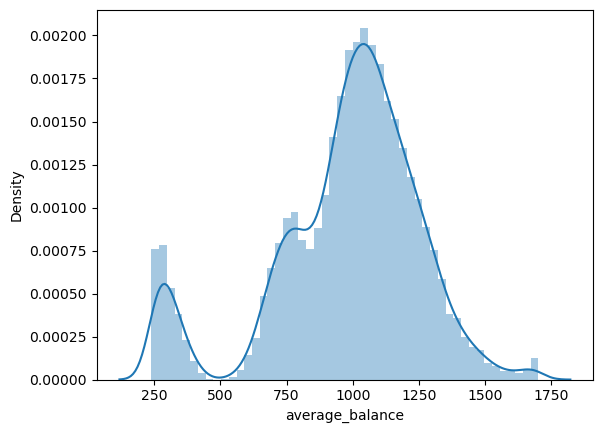

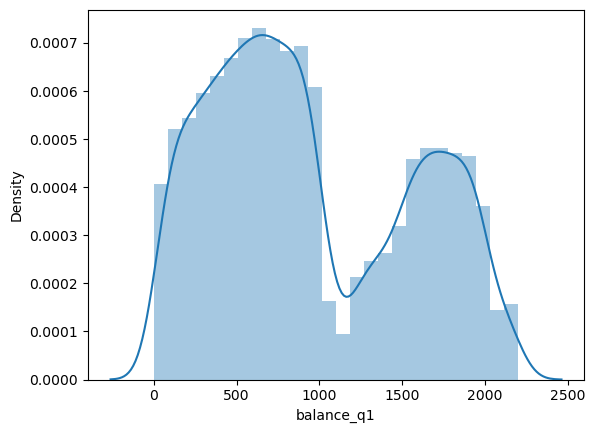

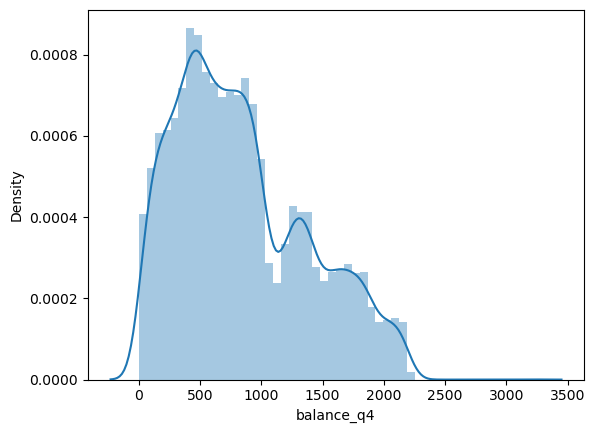

In [84]:
for i in continous1.columns:
    sns.distplot(continous1[i])
    plt.show()

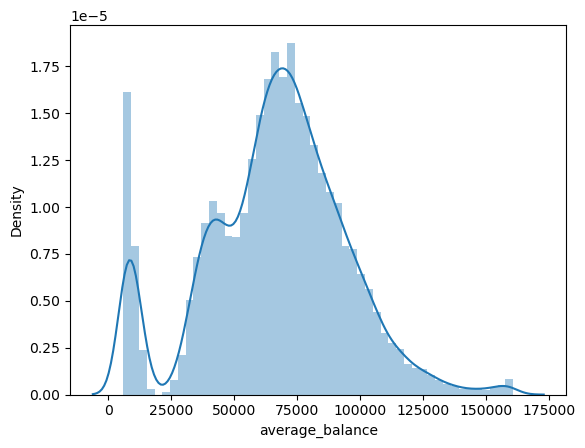

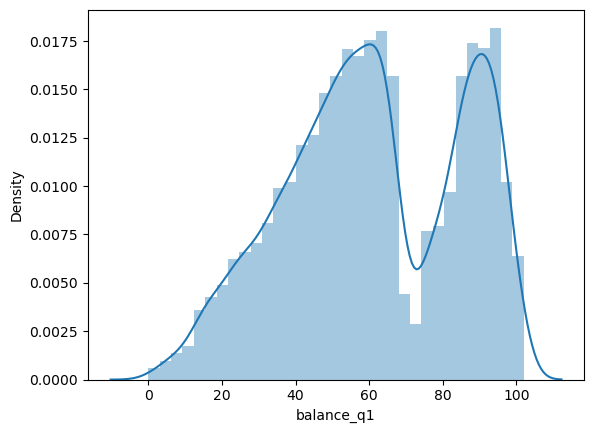

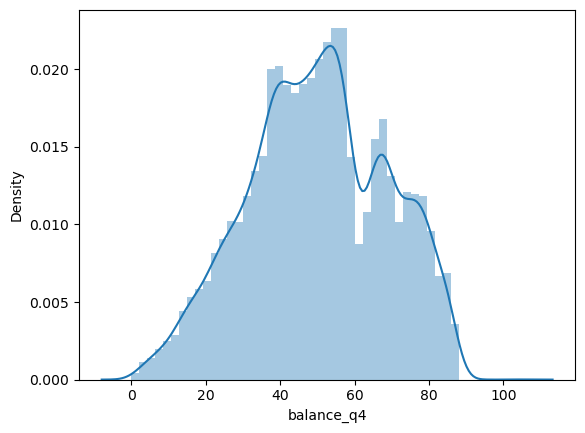

In [85]:
#Checking the distributions after transformation:
for i in continous1_transformed.columns:
    sns.distplot(continous1_transformed[i])
    plt.show()

**There is not a big improvement in the 'average_balance'. However, 'balance_q1', and 'balance_q4' got a more normal distribution. Other methods will be tried in the following.**

In [86]:
#Using log transformation
average_balance_log = np.log(continous1_transformed['average_balance'])

<AxesSubplot:xlabel='average_balance', ylabel='Density'>

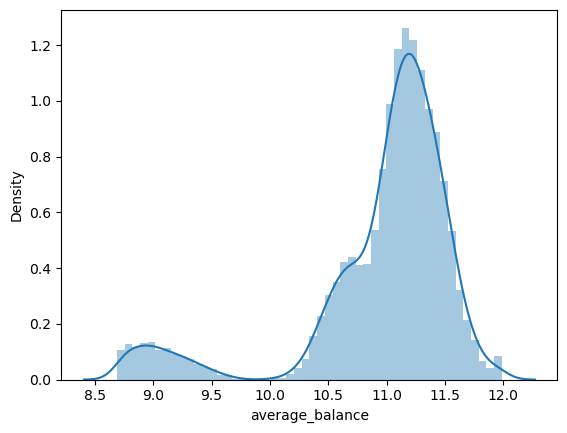

In [87]:
sns.distplot(average_balance_log)

**The average_balance column looks better with log transformation. The balance_q1&q4 don't work with log transformation as they have 0 or negative values. So, the sqrt transformation can be used as they are slightly left skewed.**

In [88]:
#Square transformation
data_log = np.sqrt(continous1_transformed['balance_q1'])

<AxesSubplot:xlabel='balance_q1', ylabel='Density'>

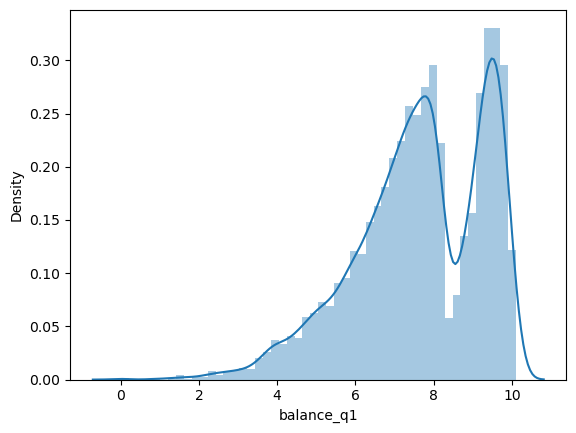

In [89]:
sns.distplot(data_log)

In [90]:
#Square transformation
data_log1 = np.sqrt(continous1_transformed['balance_q4'])

<AxesSubplot:xlabel='balance_q4', ylabel='Density'>

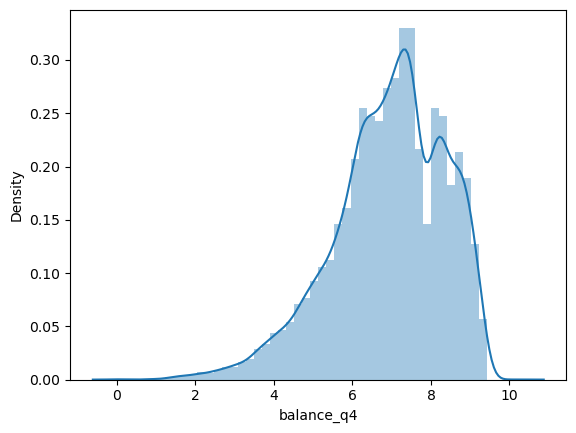

In [91]:
sns.distplot(data_log1)

**The distributions look to be closer to normal compared to before.**

**Therefore, for column 'average_balance', log transformation will be used, and for 'balance_q1' and balance_q4', square transformation will be used.**

In [92]:
#replacing the columns with transformed ones
numerical['average_balance'] = average_balance_log
numerical['balance_q1'] = data_log
numerical['balance_q4'] = data_log1

In [93]:
numerical

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q4
0,0.0,0.333333,0.0,0.428571,11.345517,9.389483,7.647517
1,0.5,0.333333,0.0,0.142857,8.933333,6.259836,5.300676
2,0.5,0.000000,0.0,0.428571,11.427845,9.251158,6.116758
3,0.0,0.333333,0.0,0.714286,11.416774,10.027014,5.901829
4,0.0,0.666667,0.0,0.428571,11.277528,9.644539,6.392402
...,...,...,...,...,...,...,...
16530,0.0,0.333333,0.0,0.142857,11.069894,5.898172,7.868386
16531,0.0,0.666667,0.0,0.285714,10.822610,8.160548,6.514789
16532,0.0,0.333333,0.0,0.428571,11.235529,8.010886,8.461268
16533,0.0,1.000000,0.5,0.142857,11.131880,7.230808,8.629128


In [94]:
#Concatinating the final transformed numericals and encoded categoricals
data2 = pd.concat([numerical, encoding_categoricals], axis=1)
data2

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,balance_q1,balance_q4,income_level,overdraft_protection,credit_rating,own_your_home,mailer_type_Letter,mailer_type_Postcard,reward_Air Miles,reward_Cash Back,reward_Points
0,0.0,0.333333,0.0,0.428571,11.345517,9.389483,7.647517,2,0,2,0,1,0,1,0,0
1,0.5,0.333333,0.0,0.142857,8.933333,6.259836,5.300676,2,0,1,1,0,1,1,0,0
2,0.5,0.000000,0.0,0.428571,11.427845,9.251158,6.116758,1,0,2,0,1,0,1,0,0
3,0.0,0.333333,0.0,0.714286,11.416774,10.027014,5.901829,1,0,1,1,1,0,1,0,0
4,0.0,0.666667,0.0,0.428571,11.277528,9.644539,6.392402,1,0,2,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16530,0.0,0.333333,0.0,0.142857,11.069894,5.898172,7.868386,1,0,0,1,0,1,1,0,0
16531,0.0,0.666667,0.0,0.285714,10.822610,8.160548,6.514789,2,0,0,1,1,0,0,1,0
16532,0.0,0.333333,0.0,0.428571,11.235529,8.010886,8.461268,2,0,0,0,1,0,0,1,0
16533,0.0,1.000000,0.5,0.142857,11.131880,7.230808,8.629128,1,0,1,1,1,0,0,1,0


In [ ]:
numerical.shape

In [ ]:
encoding_categoricals.shape

In [ ]:
data2.shape

**Now, the logistic regression can be done. However, at the beginning, we had noticed that our target is imbalanced. Therefore, before predicting the target, we should deal with the imbalanced data.**

# Dealing with imbalanced data in the target column

In [ ]:
#Splitting the X-y:

y = data2['offer_accepted']
X = data2.drop(['offer_accepted'], axis = 1)

In [ ]:
#Using Smote method(Oversampling of the minority) to have a more balanced data:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
#oversampling
X_sm, y_sm = smote.fit_resample(X, y)
y_sm.value_counts()